## Word-Cloud Plots 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sys
import scipy as sp
import os
import json
from datetime import date
import numpy as np
import math
from scipy import stats

import seaborn as sns

from IPython.display import Image
from wordcloud import WordCloud, STOPWORDS, get_single_color_func

In [2]:
# Loading the pre-processed and sampled files to pandas dataframe

directory='data' 
filename1 = 'dataSampledQuerySetRes.csv'

file = os.path.join(directory, filename1)
dataYT = pd.read_csv(file)

# filename sufix to save figures names according to part of data used
filesufix1 = "querysetres"
filesufix2 = "querysettop"

dataYT['title']  = dataYT.title.astype(str)
dataYT['channel']  = dataYT.channel.astype(str)

COL = 2

In [3]:
# data with just "top item" response
dataYTTop = dataYT[dataYT.response == 'top movie']

In [4]:
print(len(dataYT.title.values))

40960


In [5]:
# Word Cloud color auxiliary function

# Code from https://amueller.github.io/word_cloud/auto_examples/colored_by_group.html
class SimpleGroupedColorFunc(object):
    """Create a color function object which assigns EXACT colors
       to certain words based on the color to words mapping

       Parameters
       ----------
       color_to_words : dict(str -> list(str))
         A dictionary that maps a color to the list of words.

       default_color : str
         Color that will be assigned to a word that's not a member
         of any value from color_to_words.
    """

    def __init__(self, color_to_words, default_color):
        self.word_to_color = {word: color
                              for (color, words) in color_to_words.items()
                              for word in words}

        self.default_color = default_color

    def __call__(self, word, **kwargs):
        return self.word_to_color.get(word, self.default_color)


class GroupedColorFunc(object):
    """Create a color function object which assigns DIFFERENT SHADES of
       specified colors to certain words based on the color to words mapping.

       Uses wordcloud.get_single_color_func

       Parameters
       ----------
       color_to_words : dict(str -> list(str))
         A dictionary that maps a color to the list of words.

       default_color : str
         Color that will be assigned to a word that's not a member
         of any value from color_to_words.
    """

    def __init__(self, color_to_words, default_color):
        self.color_func_to_words = [
            (get_single_color_func(color), set(words))
            for (color, words) in color_to_words.items()]

        self.default_color_func = get_single_color_func(default_color)

    def get_color_func(self, word):
        """Returns a single_color_func associated with the word"""
        try:
            color_func = next(
                color_func for (color_func, words) in self.color_func_to_words
                if word in words)
        except StopIteration:
            color_func = self.default_color_func

        return color_func

    def __call__(self, word, **kwargs):
        return self.get_color_func(word)(word, **kwargs)

In [6]:
# Auxiliary colors functions

def hasKey(text, key, value, rgb=(0,0,0)):
    # Create stopword list:
    stopwords = set(STOPWORDS)
    
    if key in WordCloud(stopwords=stopwords, max_words=MAX_WORD, relative_scaling=0, collocations = False).process_text(text.lower()).keys() or key in text.lower():
        
        if value < 0:
            return (rgb[0],rgb[1], rgb[2]+1)
        elif value > 0:
            return (rgb[0]+1,rgb[1], rgb[2])
        else:
            return (rgb[0],rgb[1]+1, rgb[2])
    else:
        return (rgb[0] ,rgb[1], rgb[2])

#print(hasKey(text, 'park', 0))

def getWordColor(data, key, column, col_val):
    rgb = (0, 0, 0)
    for index, row in data.iterrows():
        rgb = hasKey(row[column], key, row[col_val], rgb)
    total = rgb[0]+rgb[1]+rgb[2]
    if total == 0:
        print(str(key) + " " + str(rgb))
        return (0, 0, 0)
    else:
        return (int((rgb[0]*255)/total), int((rgb[1]*255)/total), int((rgb[2]*255)/total))

def coloringWords(data, freqW, column, col_val):
    wordcolors = {}
    for word in freqW:
        col = getWordColor(data, word, column, col_val)
        if col in wordcolors.keys():
            wordcolors[col].append(word)
        else:
            newlist = []
            newlist.append(word)
            wordcolors[col] = newlist
    return wordcolors

In [7]:
MAX_WORD = 10000

# Generate basic cloudImage
def cloudImage(data2, column, filename):
    #text = dataF2.title.values
    text = " ".join(review for review in data2[column])

    # Create stopword list:
    stopwords = set(STOPWORDS)

    # Generate a word cloud image
    wordcloud = WordCloud(stopwords=stopwords, max_words=MAX_WORD, relative_scaling=0, collocations = False, background_color="white").generate(text)

    # Display the generated image:
    # the matplotlib way:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    fig = plt.gcf()
    fig.savefig(filename, format='eps', bbox_inches='tight', pad_inches=0.01)
    plt.show()

In [8]:
# Generate cloudImage with colors propotion to RBG of classification 
# Red - extreme
# Green - neutral
# Blue - trustable
def cloudImageClasColors(data2, column, col_val, filename):
    #text = dataF2.title.values
    text = " ".join(review.lower() for review in data2[column])

    # Create stopword list:
    stopwords = set(STOPWORDS)


    # Get words frequency
    freqs = WordCloud(stopwords=stopwords, max_words=MAX_WORD, relative_scaling=0, collocations = False).process_text(text.lower())

    # Computing colors to words relative to apparency of this work per classification
    newcolor = coloringWords(data2, freqs.keys(), column, col_val)
    
    
    # Generate a word cloud image 
    wordcloud = WordCloud(stopwords=stopwords, background_color="white", max_words=MAX_WORD, relative_scaling=0, collocations = False).generate_from_frequencies(freqs)

    default_color = 'grey'

    # Create a color function with multiple tones
    grouped_color_func = SimpleGroupedColorFunc(newcolor, default_color)

    # Color words according to computed RGB values    
    wordcloud.recolor(color_func=grouped_color_func)

    # Display the generated image:
    # the matplotlib way:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    fig = plt.gcf()
    fig.savefig(filename, format='eps', bbox_inches='tight', pad_inches=0.01)
    plt.show()
    
    

Channel Word Cloud of classification: -1


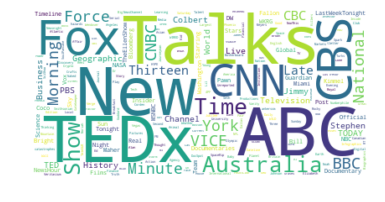

Channel Word Cloud of classification: 0


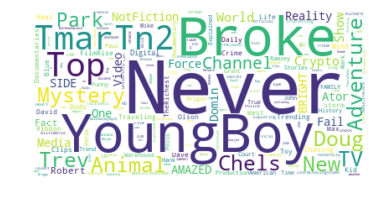

Channel Word Cloud of classification: 1


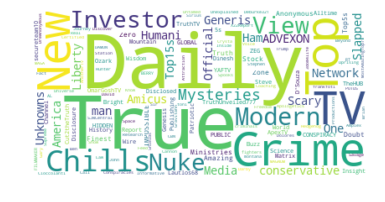

In [9]:
# Figure 1: Channel's Name Word Clou by Classification
for outkey, group in dataYT.groupby('clas'): 
    print("Channel Word Cloud of classification: " + str(outkey))
    #cloudImage(group, 'title', "figures/fig901clas" + str(filesufix1) + "_" + str(outkey) + "WordCloud.eps")
    cloudImage(group, 'channel', "figures/fig901clas" + str(filesufix1) + "_" + str(outkey) + "ChWordCloud.eps")
 

Channel Word Cloud of search query: April the Giraffe (t=1)


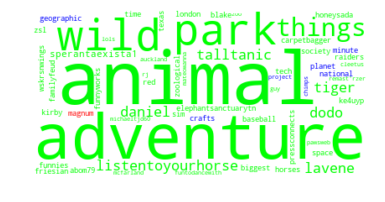

Channel Word Cloud of search query: Bitcoin Price (t=1)


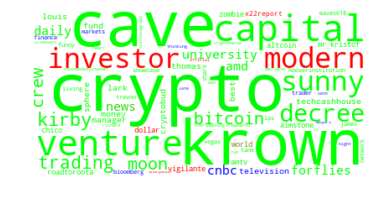

Channel Word Cloud of search query: DACA (t=1)


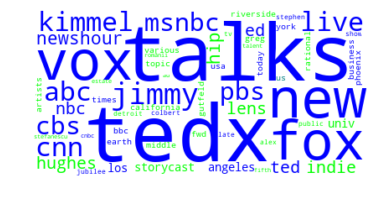

Channel Word Cloud of search query: Hurricane Harvey (t=1)


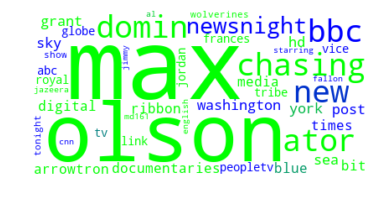

Channel Word Cloud of search query: Hurricane Irma (t=1)


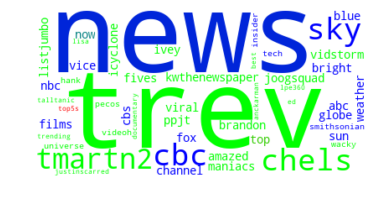

Channel Word Cloud of search query: Hurricane Jose (t=1)


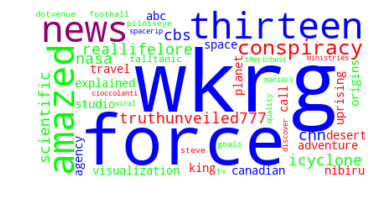

Channel Word Cloud of search query: Hurricane Maria (t=1)


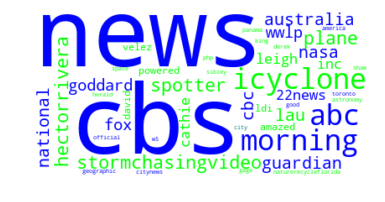

Channel Word Cloud of search query: Las Vegas shooting (t=1)


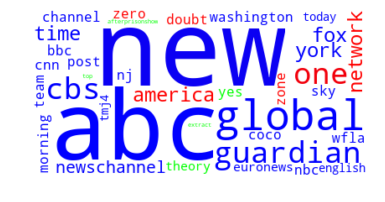

Channel Word Cloud of search query: North Korea (t=1)


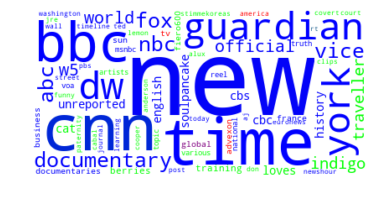

Channel Word Cloud of search query: Solar Eclipse (t=1)


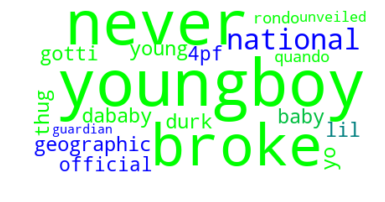

Channel Word Cloud of search query: April the Giraffe (t=2)


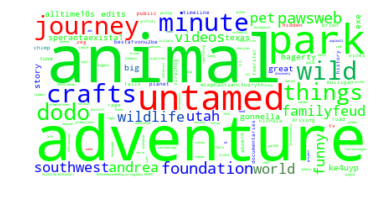

Channel Word Cloud of search query: Bitcoin Price (t=2)


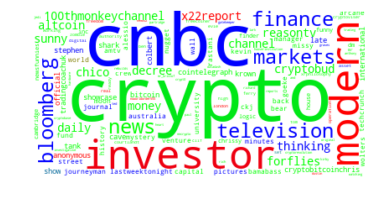

Channel Word Cloud of search query: DACA (t=2)


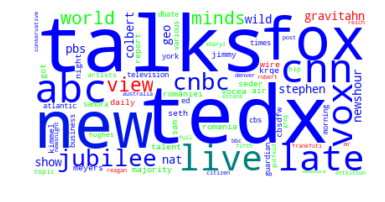

Channel Word Cloud of search query: Hurricane Harvey (t=2)


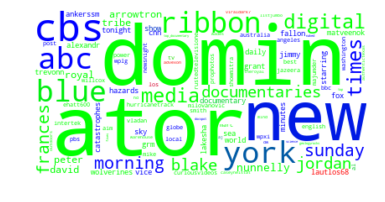

Channel Word Cloud of search query: Hurricane Irma (t=2)


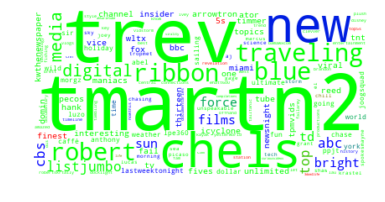

Channel Word Cloud of search query: Hurricane Jose (t=2)


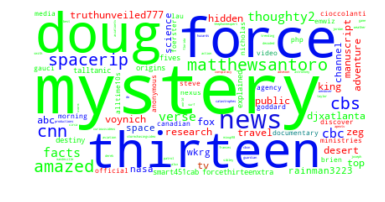

Channel Word Cloud of search query: Hurricane Maria (t=2)


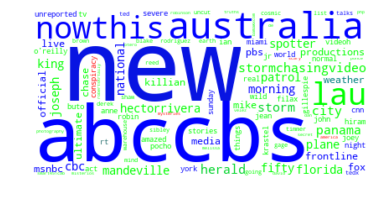

Channel Word Cloud of search query: Las Vegas shooting (t=2)


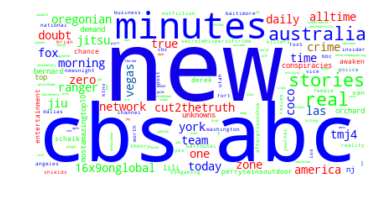

Channel Word Cloud of search query: North Korea (t=2)


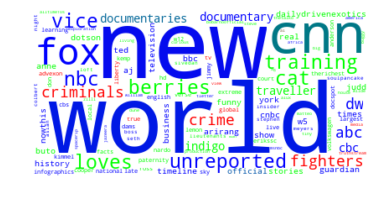

Channel Word Cloud of search query: Solar Eclipse (t=2)


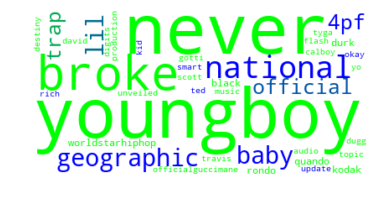

Channel Word Cloud of search query: April the Giraffe (t=3)


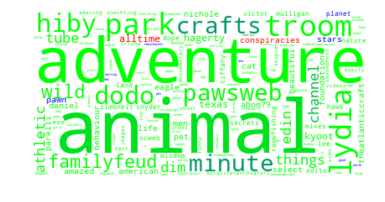

Channel Word Cloud of search query: Bitcoin Price (t=3)


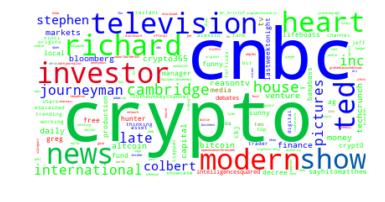

Channel Word Cloud of search query: DACA (t=3)


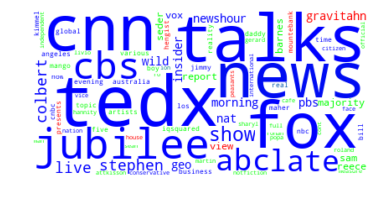

Channel Word Cloud of search query: Hurricane Harvey (t=3)


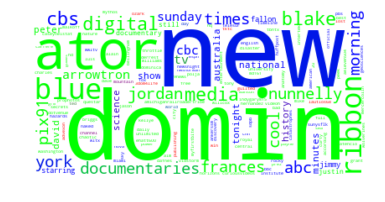

Channel Word Cloud of search query: Hurricane Irma (t=3)


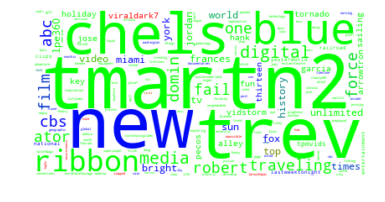

Channel Word Cloud of search query: Hurricane Jose (t=3)


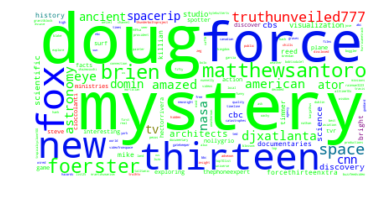

Channel Word Cloud of search query: Hurricane Maria (t=3)


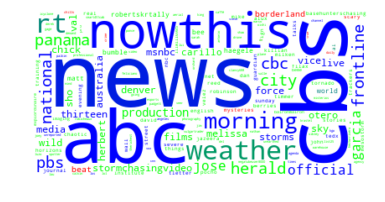

Channel Word Cloud of search query: Las Vegas shooting (t=3)


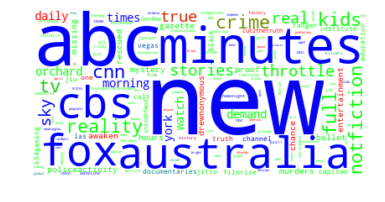

Channel Word Cloud of search query: North Korea (t=3)


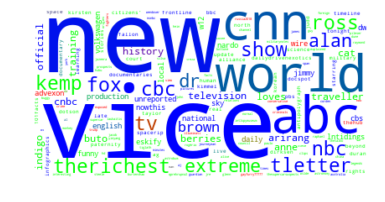

Channel Word Cloud of search query: Solar Eclipse (t=3)


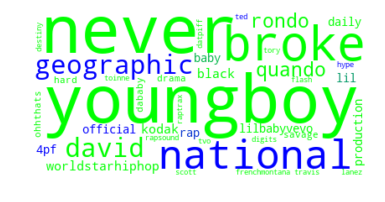

Channel Word Cloud of search query: April the Giraffe (t=4)


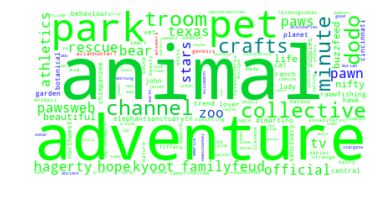

Channel Word Cloud of search query: Bitcoin Price (t=4)


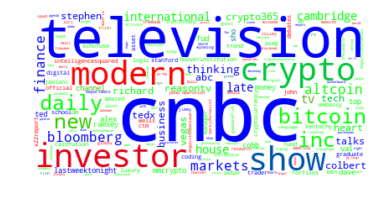

Channel Word Cloud of search query: DACA (t=4)


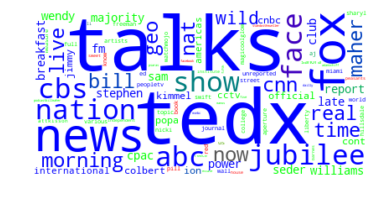

Channel Word Cloud of search query: Hurricane Harvey (t=4)


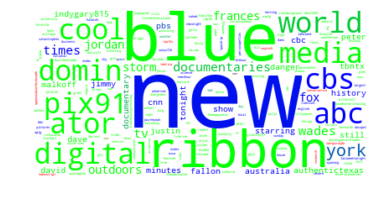

Channel Word Cloud of search query: Hurricane Irma (t=4)


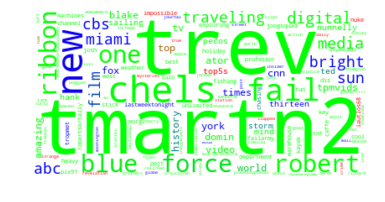

Channel Word Cloud of search query: Hurricane Jose (t=4)


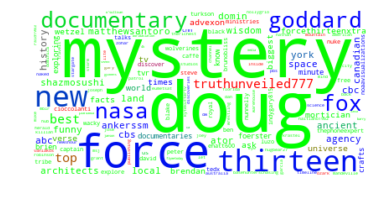

Channel Word Cloud of search query: Hurricane Maria (t=4)


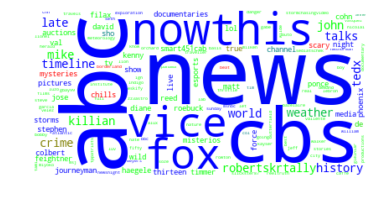

Channel Word Cloud of search query: Las Vegas shooting (t=4)


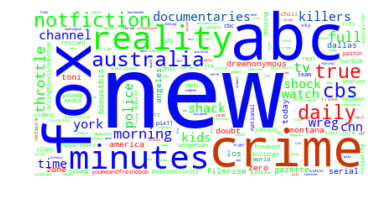

Channel Word Cloud of search query: North Korea (t=4)


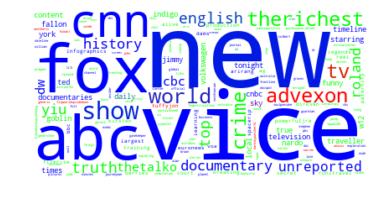

Channel Word Cloud of search query: Solar Eclipse (t=4)


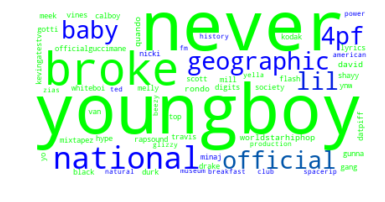

Channel Word Cloud of search query: April the Giraffe (t=5)


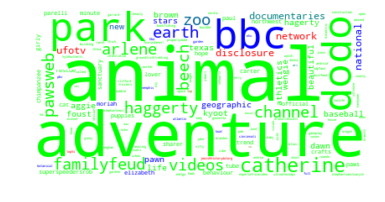

Channel Word Cloud of search query: Bitcoin Price (t=5)


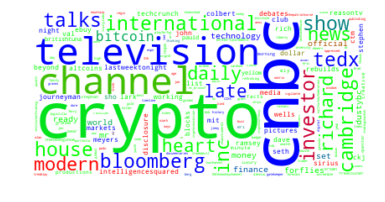

Channel Word Cloud of search query: DACA (t=5)


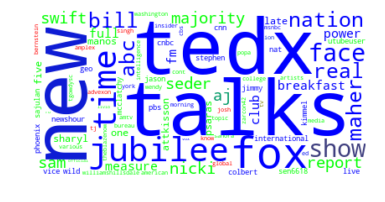

Channel Word Cloud of search query: Hurricane Harvey (t=5)


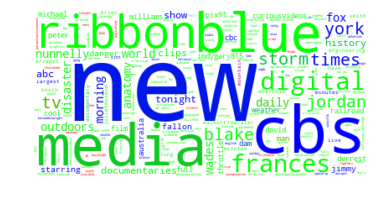

Channel Word Cloud of search query: Hurricane Irma (t=5)


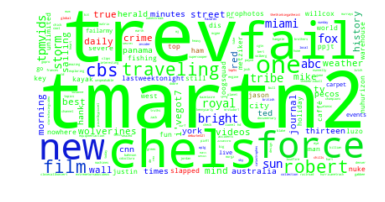

Channel Word Cloud of search query: Hurricane Jose (t=5)


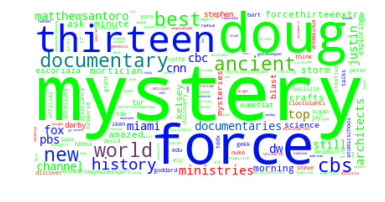

Channel Word Cloud of search query: Hurricane Maria (t=5)


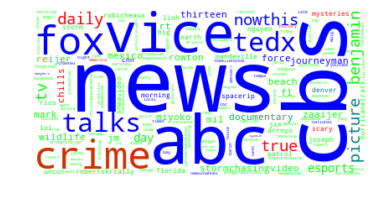

Channel Word Cloud of search query: Las Vegas shooting (t=5)


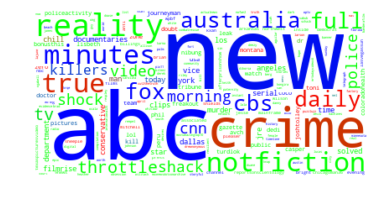

Channel Word Cloud of search query: North Korea (t=5)


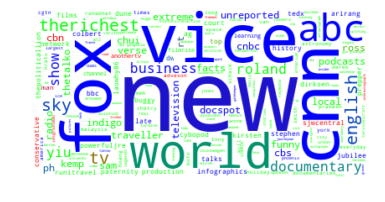

Channel Word Cloud of search query: Solar Eclipse (t=5)


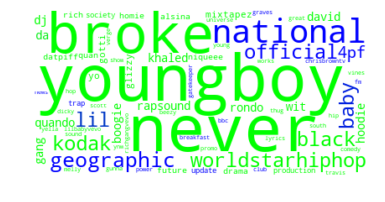

Channel Word Cloud of search query: April the Giraffe (t=6)


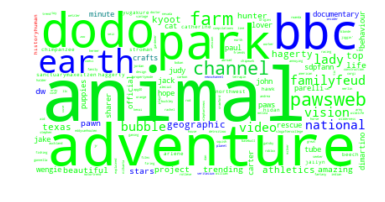

Channel Word Cloud of search query: Bitcoin Price (t=6)


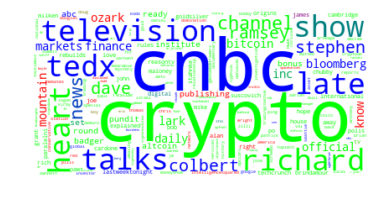

Channel Word Cloud of search query: DACA (t=6)


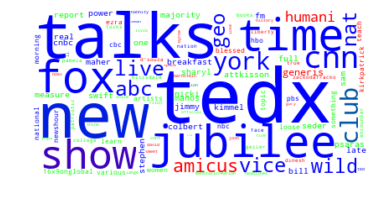

Channel Word Cloud of search query: Hurricane Harvey (t=6)


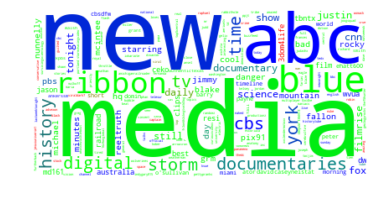

Channel Word Cloud of search query: Hurricane Irma (t=6)


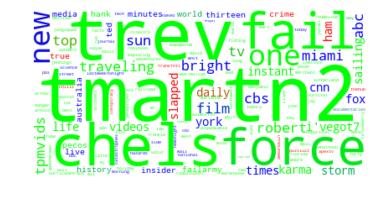

Channel Word Cloud of search query: Hurricane Jose (t=6)


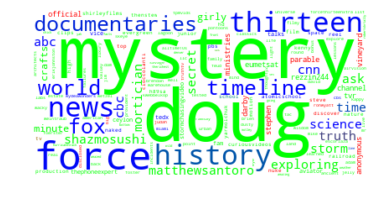

Channel Word Cloud of search query: Hurricane Maria (t=6)


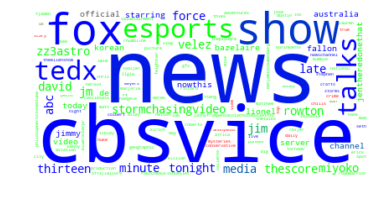

Channel Word Cloud of search query: Las Vegas shooting (t=6)


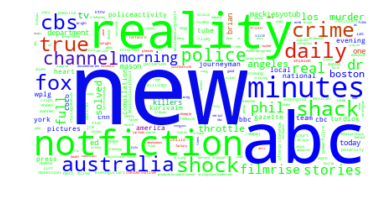

Channel Word Cloud of search query: North Korea (t=6)


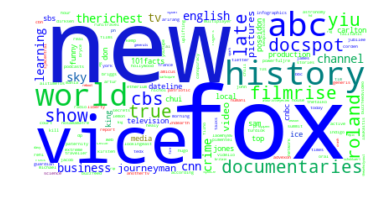

Channel Word Cloud of search query: Solar Eclipse (t=6)


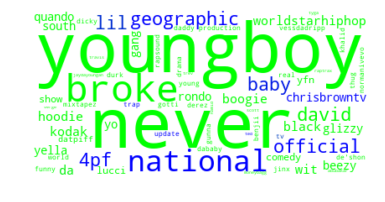

Channel Word Cloud of search query: April the Giraffe (t=7)


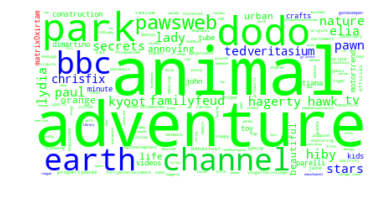

Channel Word Cloud of search query: Bitcoin Price (t=7)


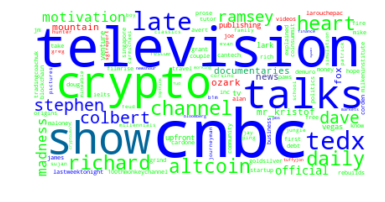

Channel Word Cloud of search query: DACA (t=7)


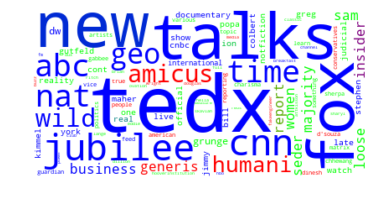

Channel Word Cloud of search query: Hurricane Harvey (t=7)


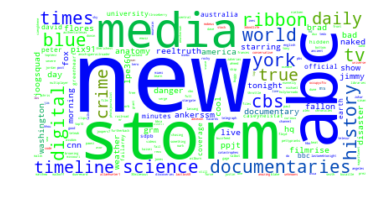

Channel Word Cloud of search query: Hurricane Irma (t=7)


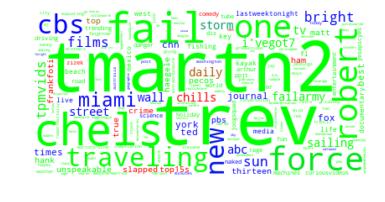

Channel Word Cloud of search query: Hurricane Jose (t=7)


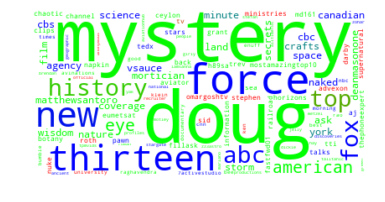

Channel Word Cloud of search query: Hurricane Maria (t=7)


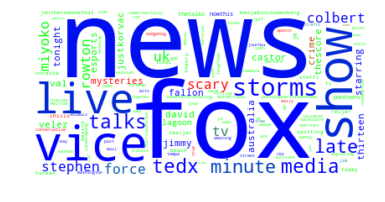

Channel Word Cloud of search query: Las Vegas shooting (t=7)


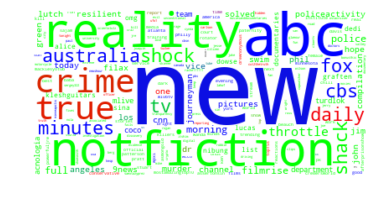

Channel Word Cloud of search query: North Korea (t=7)


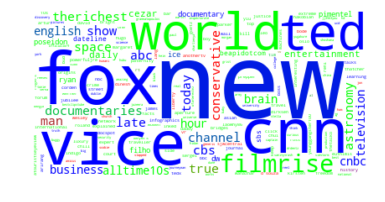

Channel Word Cloud of search query: Solar Eclipse (t=7)


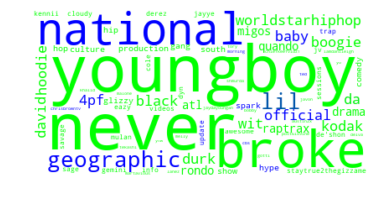

Channel Word Cloud of search query: April the Giraffe (t=8)


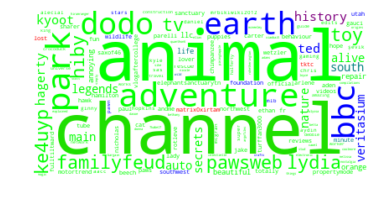

Channel Word Cloud of search query: Bitcoin Price (t=8)


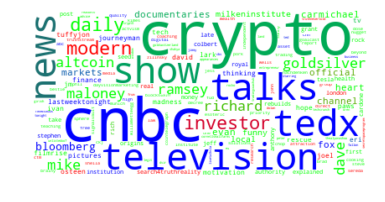

Channel Word Cloud of search query: DACA (t=8)


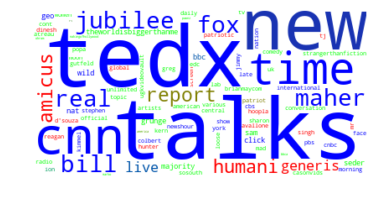

Channel Word Cloud of search query: Hurricane Harvey (t=8)


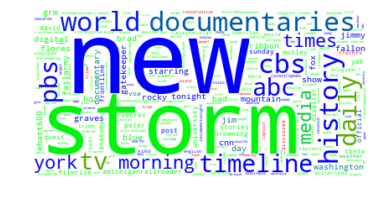

Channel Word Cloud of search query: Hurricane Irma (t=8)


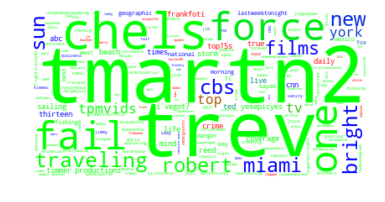

Channel Word Cloud of search query: Hurricane Jose (t=8)


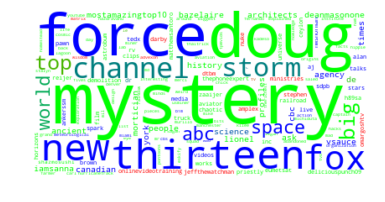

Channel Word Cloud of search query: Hurricane Maria (t=8)


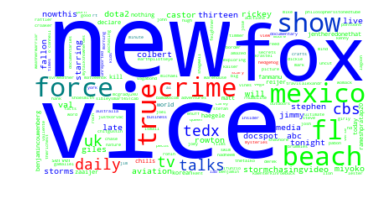

Channel Word Cloud of search query: Las Vegas shooting (t=8)


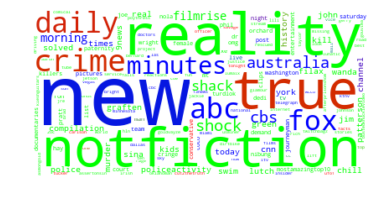

Channel Word Cloud of search query: North Korea (t=8)


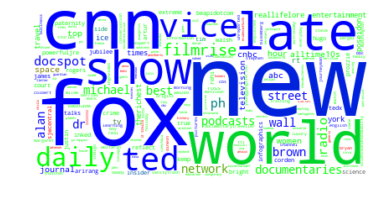

Channel Word Cloud of search query: Solar Eclipse (t=8)


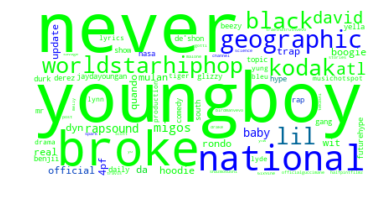

Channel Word Cloud of search query: April the Giraffe (t=9)


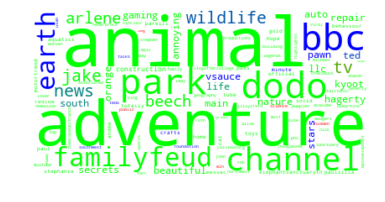

Channel Word Cloud of search query: Bitcoin Price (t=9)


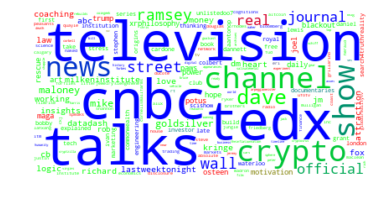

Channel Word Cloud of search query: DACA (t=9)


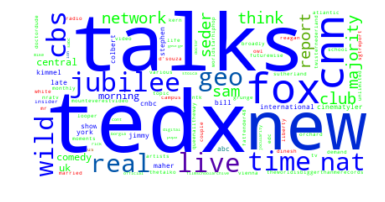

Channel Word Cloud of search query: Hurricane Harvey (t=9)


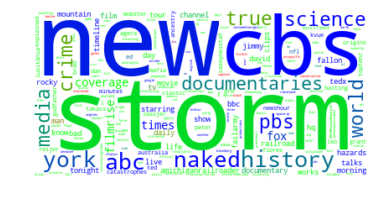

Channel Word Cloud of search query: Hurricane Irma (t=9)


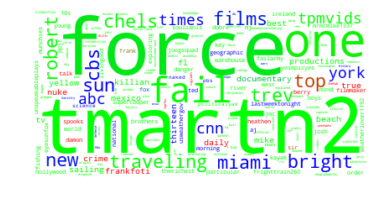

Channel Word Cloud of search query: Hurricane Jose (t=9)


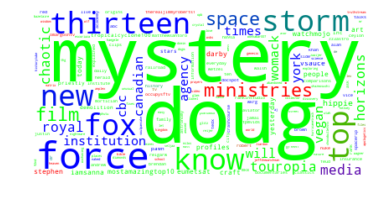

Channel Word Cloud of search query: Hurricane Maria (t=9)


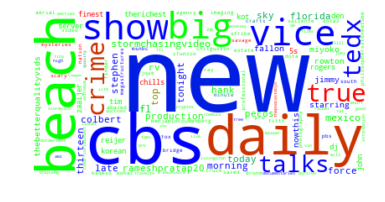

Channel Word Cloud of search query: Las Vegas shooting (t=9)


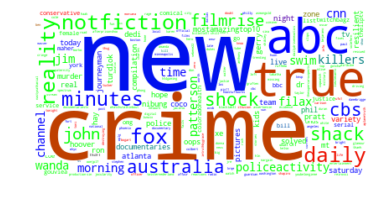

Channel Word Cloud of search query: North Korea (t=9)


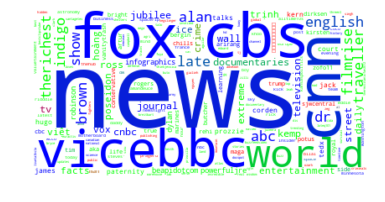

Channel Word Cloud of search query: Solar Eclipse (t=9)


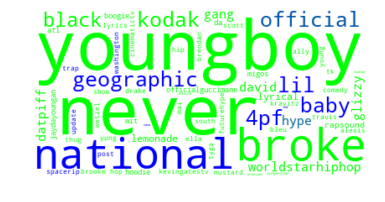

Channel Word Cloud of search query: April the Giraffe (t=10)


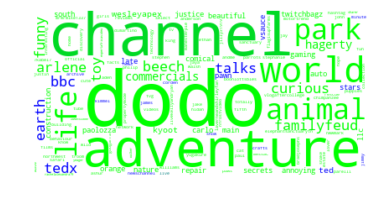

Channel Word Cloud of search query: Bitcoin Price (t=10)


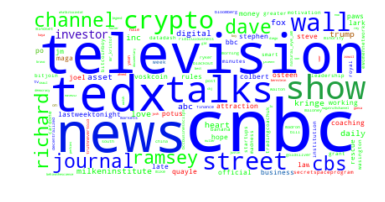

Channel Word Cloud of search query: DACA (t=10)


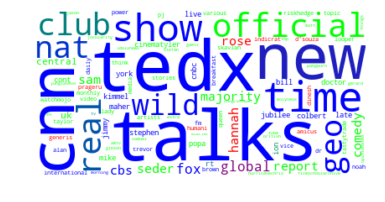

Channel Word Cloud of search query: Hurricane Harvey (t=10)


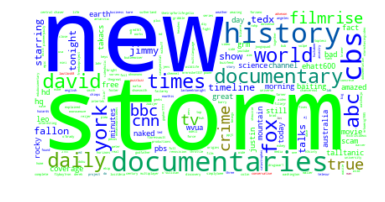

Channel Word Cloud of search query: Hurricane Irma (t=10)


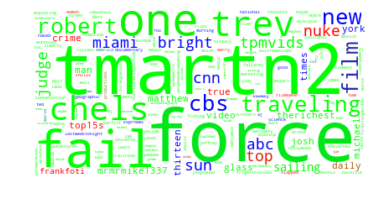

Channel Word Cloud of search query: Hurricane Jose (t=10)


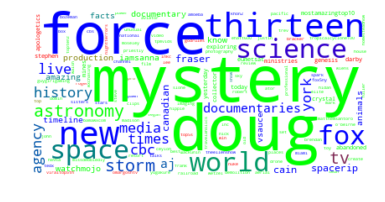

Channel Word Cloud of search query: Hurricane Maria (t=10)


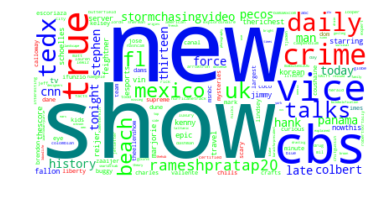

Channel Word Cloud of search query: Las Vegas shooting (t=10)


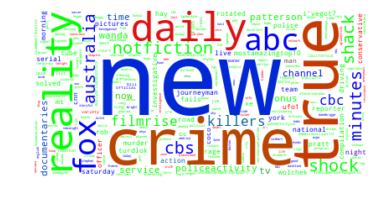

Channel Word Cloud of search query: North Korea (t=10)


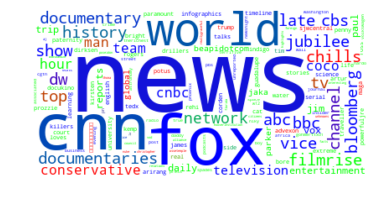

Channel Word Cloud of search query: Solar Eclipse (t=10)


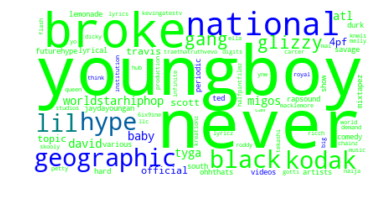

In [10]:
## Figure 10: Word Cloud of Recommended Channel's Names by search Query in time
for key, group in dataYTTop.groupby('bin'): 
    for key2, group2 in group.groupby('search'):
        outkey = ""
        for w in str(key2).split():
            outkey += w
        #cloudImage(group2, 'title', "figures/fig902" + str(filesufix) + "_" + str(key) + outkey + "WordCloud.eps")
        #cloudImage(group2, 'channel', "figures/fig902" + str(filesufix) + "_" + str(key)  + outkey + "ChWordCloud.eps")
        
        if COL > 0:
            print("Channel Word Cloud of search query: " + str(key2) + " (t=" + str(key) + ")")
            #cloudImageClasColors(group2, 'title', 'clas', "figures/figc902" + str(filesufix) + "_" + str(key) + outkey + "WordCloud.eps")
            cloudImageClasColors(group2, 'channel', 'clas', "figures/figc902" + str(filesufix2) + "_" + str(key)  + outkey + "ChWordCloud.eps")

April the Giraffe ApriltheGiraffe
Channel Overall Word Cloud of search query: April the Giraffe


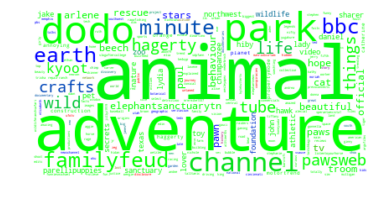

Bitcoin Price BitcoinPrice
Channel Overall Word Cloud of search query: Bitcoin Price


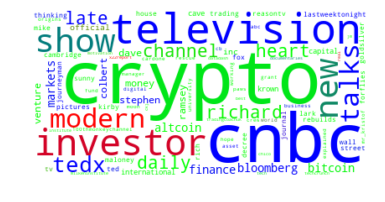

DACA DACA
Channel Overall Word Cloud of search query: DACA


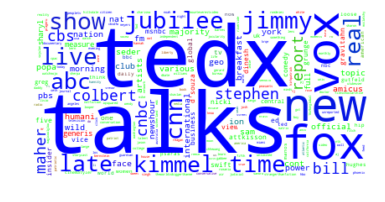

Hurricane Harvey HurricaneHarvey
Channel Overall Word Cloud of search query: Hurricane Harvey


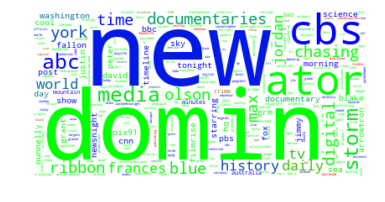

Hurricane Irma HurricaneIrma
Channel Overall Word Cloud of search query: Hurricane Irma


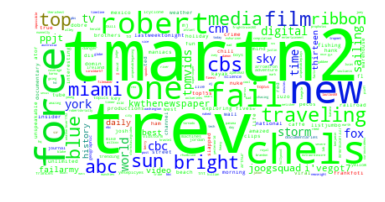

Hurricane Jose HurricaneJose
Channel Overall Word Cloud of search query: Hurricane Jose


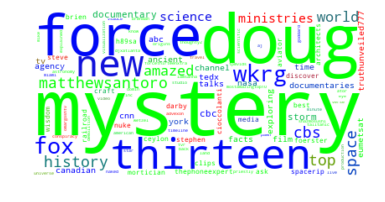

Hurricane Maria HurricaneMaria
Channel Overall Word Cloud of search query: Hurricane Maria


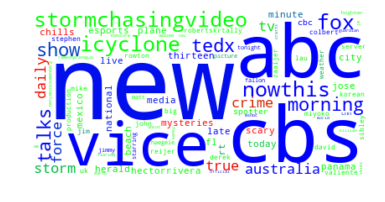

Las Vegas shooting LasVegasshooting
Channel Overall Word Cloud of search query: Las Vegas shooting


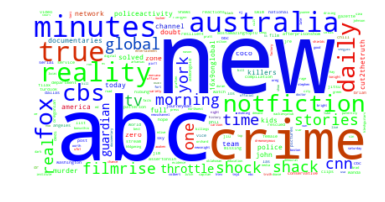

North Korea NorthKorea
Channel Overall Word Cloud of search query: North Korea


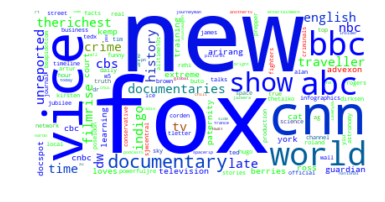

Solar Eclipse SolarEclipse
Channel Overall Word Cloud of search query: Solar Eclipse


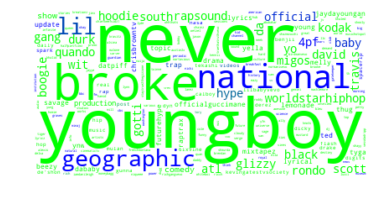

In [11]:
for key, group in dataYTTop.groupby('search'):
    outkey = ""
    for w in str(key).split():
        outkey += w
    print(key + " " + outkey)    
    #cloudImage(group, 'title', "figures/fig903" + str(filesufix) + "_" + outkey + "WordCloud.eps")
    #cloudImage(group, 'channel', "figures/fig903" + str(filesufix) + "_" + outkey + "ChWordCloud.eps")
    
    if COL > 0:
        print("Channel Overall Word Cloud of search query: " + str(key))
        #cloudImageClasColors(group, 'title','clas', "figures/figc903" + str(filesufix) + "_" + outkey + "WordCloud.eps")
        cloudImageClasColors(group, 'channel', 'clas',"figures/figc903" + str(filesufix2) + "_" + outkey + "ChWordCloud.eps")